In [400]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle 
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier

## Analisis de Datos

### Lectura de Datos

In [4]:
seed = 666
np.random.seed(seed)

In [5]:
df = pd.read_csv('datos/train_default.csv', sep = '|' )

In [6]:
pd.set_option('display.max_columns',None)
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,230000.0,2,3,1,37,0,0,0,0,0,0,228342.0,189966.0,142377.0,143828.0,143698.0,143342.0,6100.0,7000.0,5356.0,5400.0,5200.0,5500.0,0
5621,14027,50000.0,2,3,2,34,0,0,0,0,0,0,51037.0,47669.0,48940.0,50545.0,29523.0,28960.0,2100.0,2329.0,2943.0,990.0,1168.0,975.0,0
5622,23575,290000.0,2,2,1,34,0,0,0,0,-1,0,53437.0,44037.0,5441.0,7371.0,38832.0,41955.0,1274.0,1200.0,2033.0,38832.0,3900.0,188423.0,0
5623,21834,150000.0,2,2,2,26,0,0,0,0,0,0,83446.0,75067.0,64432.0,54848.0,46098.0,47352.0,3500.0,3000.0,2000.0,2000.0,2000.0,2000.0,0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CUSTOMER_ID                 5625 non-null   int64  
 1   LIMIT_BAL                   5625 non-null   float64
 2   SEX                         5625 non-null   int64  
 3   EDUCATION                   5625 non-null   int64  
 4   MARRIAGE                    5625 non-null   int64  
 5   AGE                         5625 non-null   int64  
 6   PAY_0                       5625 non-null   int64  
 7   PAY_2                       5625 non-null   int64  
 8   PAY_3                       5625 non-null   int64  
 9   PAY_4                       5625 non-null   int64  
 10  PAY_5                       5625 non-null   int64  
 11  PAY_6                       5625 non-null   int64  
 12  BILL_AMT1                   5625 non-null   float64
 13  BILL_AMT2                   5625 

In [8]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,15238.895644,163935.587556,1.609956,1.838756,1.558044,35.380978,0.000711,-0.105244,-0.136889,-0.206756,-0.245867,-0.268800,49477.308622,47841.909511,4.609335e+04,41785.053867,39086.867378,37615.092622,5479.214400,6.446782e+03,5155.716622,4789.243200,4700.983644,5003.040178,0.220978
std,8559.798257,127902.220141,0.487803,0.786934,0.518728,9.144802,1.131000,1.211733,1.200299,1.158074,1.144049,1.162597,69292.868929,67238.808622,6.928598e+04,59771.019553,56487.673746,55559.215787,15342.151617,3.332234e+04,15494.010969,15631.744562,14347.984080,17544.870552,0.414942
min,2.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-69777.000000,-2.032000e+04,-170000.000000,-61372.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
1%,369.240000,10000.000000,1.000000,1.000000,1.000000,22.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-132.200000,-164.840000,-1.250000e+02,-156.080000,-135.200000,-250.200000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
5%,1727.400000,20000.000000,1.000000,1.000000,1.000000,23.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7920.000000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3656.000000,3258.000000,2.904000e+03,2571.000000,1908.000000,1324.000000,1000.000000,7.880000e+02,500.000000,267.000000,216.000000,100.000000,0.000000
50%,15225.000000,130000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22872.000000,22453.000000,2.057100e+04,19561.000000,18874.000000,17934.000000,2130.000000,2.000000e+03,1831.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,22623.000000,230000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65802.000000,62147.000000,5.946500e+04,52330.000000,49366.000000,48833.000000,5000.000000,5.000000e+03,4400.000000,4000.000000,4000.000000,4000.000000,0.000000
95%,28545.000000,420000.000000,2.000000,3.000000,2.000000,53.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,192976.000000,186869.800000,1.789370e+05,165278.800000,159272.000000,153470.800000,17505.200000,1.829620e+04,17761.800000,15544.800000,16238.200000,16078.200000,1.000000


In [9]:
df.isnull().sum()

CUSTOMER_ID                   0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

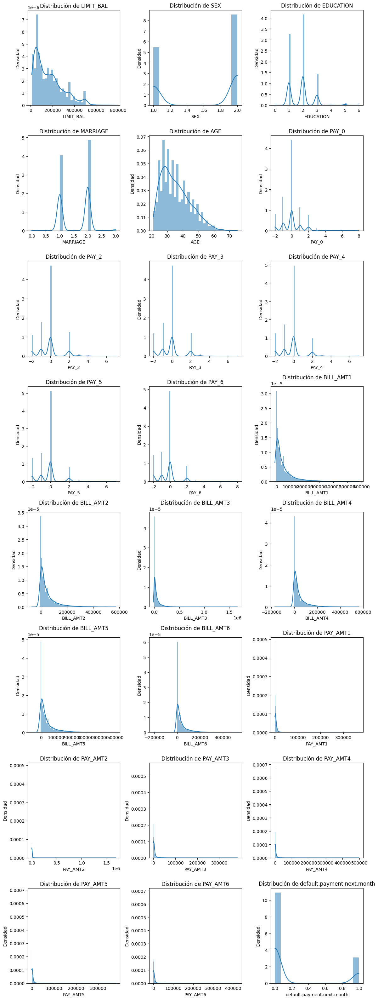

In [10]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

### Ingenieria de variables

In [11]:
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,27475,230000.0,2,3,1,37,0,0,0,0,0,0,228342.0,189966.0,142377.0,143828.0,143698.0,143342.0,6100.0,7000.0,5356.0,5400.0,5200.0,5500.0,0
5621,14027,50000.0,2,3,2,34,0,0,0,0,0,0,51037.0,47669.0,48940.0,50545.0,29523.0,28960.0,2100.0,2329.0,2943.0,990.0,1168.0,975.0,0
5622,23575,290000.0,2,2,1,34,0,0,0,0,-1,0,53437.0,44037.0,5441.0,7371.0,38832.0,41955.0,1274.0,1200.0,2033.0,38832.0,3900.0,188423.0,0
5623,21834,150000.0,2,2,2,26,0,0,0,0,0,0,83446.0,75067.0,64432.0,54848.0,46098.0,47352.0,3500.0,3000.0,2000.0,2000.0,2000.0,2000.0,0


In [12]:
# Ratio de deuda respecto al limite de credito
df['Ratio_Debt'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)/df['LIMIT_BAL'] 

In [13]:
df['Max_Estatus_Pay'] = df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].max(axis = 1) # Maximo valor Pay

In [14]:
df['Promedio_Estatus_Pay'] = df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].mean(axis = 1) # Promedio valor Pay

In [15]:
df['Pago_desviacion'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].std(axis = 1)

In [16]:
df['Ratio_Payment'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) / df['LIMIT_BAL'] # Cantidad pagada sobre limite de credito

In [17]:
df['Count_Pay_Retrasados'] = (df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] > 0 ).sum(axis = 1) # Conrteo de registros de meses atrasados

In [18]:
df['Count_Pay_A_Tiempo'] = (df[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] == -1).sum(axis = 1) # Conteo de meses pagados a tiempo

In [19]:
df['Total_Pay'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) # Total pagado 

In [20]:
df['Total_Bill'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1) # Deuda total

In [21]:
df['Pay/Bill'] =np.where(df['Total_Bill'] == 0, 0, df['Total_Pay'] / df['Total_Bill']) # Ratio de pago sobre deuda

In [22]:
df['Pay_amount_mean'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis = 1) # Promedio de cantidad a pagar

In [23]:
len(df[df['Pay/Bill'] == np.inf])

0

In [24]:
df['Pay_tendencia'] = df['PAY_AMT1'] - df ['PAY_AMT6'] # Comparacion del ultimo mes y el primero respecto a lo que se paga

In [25]:
df['Bill_tendencia'] = df['BILL_AMT1'] - df['BILL_AMT6'] # Comparacion del ultimo mes y el primero respecto a la deuda

In [26]:
df['Bill_amount_mean'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis = 1) # Promedio de cantidad de deuda

In [27]:
df['Diff_Bill_Pay'] = df['Total_Bill'] - df ['Total_Pay'] # Diferencia de Deuda con lo que se paga

In [28]:
df['Pay_tendencia_Amplia'] = df[['PAY_AMT1','PAY_AMT2','PAY_AMT3']].mean(axis = 1) - df[['PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis =1)
# Tendencia amplia de la cantidad pagada 

In [29]:
df['Bill_tendencia_Amplia'] = df[['BILL_AMT1','BILL_AMT2','BILL_AMT3']].mean(axis = 1) - df[['BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis =1)
# Tendencia amplia de la deuda

In [30]:
df['Diff_Bill_Pay_Tendencia'] = ((df['BILL_AMT1'] - df['PAY_AMT1']) - (df['BILL_AMT6'] - df['PAY_AMT6']))
# Tendencia de la diferencia entre la deuda y lo pagado 

In [31]:
df['Diff_Bill_Pay_Tendencia_Amplia'] = (
    (df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].mean(axis=1)  - df[['PAY_AMT1','PAY_AMT2', 'PAY_AMT3']].mean(axis=1))
    - 
    ( df[['BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].mean(axis=1) - df[['PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].mean(axis=1))
)
# Tendencia amplia de la diferencia entre la deuda y lo pagado 

In [32]:
df['Meses_Pago_Completo'] = ((df['PAY_AMT1'] >= df['BILL_AMT1']).astype(int) + ( # Comparamos donde el pago fur mayor a la deuda
                            df['PAY_AMT2'] >= df['BILL_AMT2']).astype(int) + (
                            df['PAY_AMT3'] >= df['BILL_AMT3']).astype(int) + (
                            df['PAY_AMT4'] >= df['BILL_AMT4']).astype(int) + (
                            df['PAY_AMT5'] >= df['BILL_AMT5']).astype(int) +(
                            df['PAY_AMT6'] >= df['BILL_AMT6']).astype(int))

In [33]:
df['Meses_Deuda'] = ((df['PAY_AMT1'] <= df['BILL_AMT1']).astype(int) +( # Comparamos donde la deuda es mayor a el pago
                    df['PAY_AMT2'] <= df['BILL_AMT2']).astype(int) + (
                    df['PAY_AMT3'] <= df['BILL_AMT3']).astype(int) + (
                    df['PAY_AMT4'] <= df['BILL_AMT4']).astype(int) + (
                    df['PAY_AMT5'] <= df['BILL_AMT5']).astype(int) + (
                    df['PAY_AMT6'] <= df['BILL_AMT6']).astype(int))

In [34]:
df['Age_Quartile'] = pd.qcut(df['AGE'], q =4, labels = ['Joven', 'Adulto joven', 'Adulto', 'Mayor']) # Dividimos las edades en 4 bins 

In [35]:
df['Pay_tendencia_ponderada'] = ((df['PAY_AMT1'] * 1) +( # Le damos un mayor peso a las variables mas cercanas inmediatamente 
                                df['PAY_AMT2'] * 0.75) + (
                                df['PAY_AMT3'] * 0.6) + (
                                df['PAY_AMT4'] * 0.45) + (
                                df['PAY_AMT5'] * 0.3 ) + (
                                df['PAY_AMT6'] * 0.15))

In [36]:
df['Bill_tendencia_ponderada'] = ((df['BILL_AMT1'] * 1) + ( # Le damos un mayor peso a las variables mas cercanas inmediatamente 
                                df['BILL_AMT2'] * 0.75) + (
                                df['BILL_AMT3'] * 0.6) + (
                                df['BILL_AMT4'] * 0.45 ) + (
                                df['BILL_AMT5'] * 0.3) + (
                                df['BILL_AMT6'] * 0.15))

In [37]:
df.isna().sum()

CUSTOMER_ID                       0
LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
default.payment.next.month        0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay        

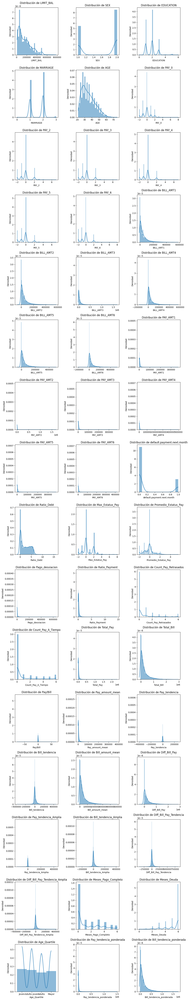

In [38]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [39]:
lst_column_log = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2',
                  'PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Ratio_Debt','Ratio_Payment','Total_Pay','Total_Bill',
                  'Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Pay_tendencia_ponderada','Bill_tendencia_ponderada','Pago_desviacion']

In [40]:
df.columns

Index(['CUSTOMER_ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE',
       'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1',
       'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
       'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month', 'Ratio_Debt', 'Max_Estatus_Pay',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment',
       'Count_Pay_Retrasados', 'Count_Pay_A_Tiempo', 'Total_Pay', 'Total_Bill',
       'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia', 'Bill_tendencia',
       'Bill_amount_mean', 'Diff_Bill_Pay', 'Pay_tendencia_Amplia',
       'Bill_tendencia_Amplia', 'Diff_Bill_Pay_Tendencia',
       'Diff_Bill_Pay_Tendencia_Amplia', 'Meses_Pago_Completo', 'Meses_Deuda',
       'Age_Quartile', 'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada'],
      dtype='object')

In [41]:
lst_column_log

['LIMIT_BAL',
 'AGE',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Ratio_Payment',
 'Total_Pay',
 'Total_Bill',
 'Pay_amount_mean',
 'Bill_amount_mean',
 'Diff_Bill_Pay',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'Pago_desviacion']

In [42]:
for col in lst_column_log:
    offset = abs(df[col].min()) + 1
    df[f'{col}_log'] = np.log1p(df[col] + offset)

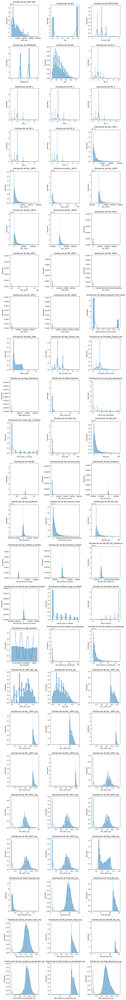

In [43]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

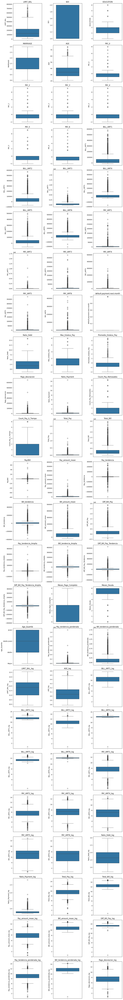

In [44]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i) 
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()


In [45]:
pd.set_option('display.max_rows', None)
df.isnull().sum()

CUSTOMER_ID                       0
LIMIT_BAL                         0
SEX                               0
EDUCATION                         0
MARRIAGE                          0
AGE                               0
PAY_0                             0
PAY_2                             0
PAY_3                             0
PAY_4                             0
PAY_5                             0
PAY_6                             0
BILL_AMT1                         0
BILL_AMT2                         0
BILL_AMT3                         0
BILL_AMT4                         0
BILL_AMT5                         0
BILL_AMT6                         0
PAY_AMT1                          0
PAY_AMT2                          0
PAY_AMT3                          0
PAY_AMT4                          0
PAY_AMT5                          0
PAY_AMT6                          0
default.payment.next.month        0
Ratio_Debt                        0
Max_Estatus_Pay                   0
Promedio_Estatus_Pay        

In [46]:
pd.reset_option('display.max_rows')

In [47]:
df.describe([0.01,0.05, 0.25, 0.5, 0.75, 0.95 ,0.99])

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5.625000e+03,5.625000e+03,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000,5625.000000
mean,15238.895644,163935.587556,1.609956,1.838756,1.558044,35.380978,0.000711,-0.105244,-0.136889,-0.206756,-0.245867,-0.268800,49477.308622,47841.909511,4.609335e+04,41785.053867,39086.867378,37615.092622,5479.214400,6.446782e+03,5155.716622,4789.243200,4700.983644,5003.040178,0.220978,2.245973,0.455822,-0.160474,5975.619367,0.235346,0.863822,1.124978,3.157498e+04,2.618996e+05,0.368810,5262.496711,476.174222,11862.216000,43649.930637,2.303246e+05,862.815407,8308.518696,11386.041778,7445.703289,1.443200,5.154311,1.772364e+04,1.491864e+05,11.767648,4.055285,10.541851,11.564610,10.771337,12.231976,11.411146,12.394273,6.739499,6.651032,6.500870,6.195874,6.163331,6.090106,1.663700,0.796948,9.246429,12.584195,7.544404,10.792796,13.315172,8.703228,11.863444,7.182995
std,8559.798257,127902.220141,0.487803,0.786934,0.518728,9.144802,1.131000,1.211733,1.200299,1.158074,1.144049,1.162597,69292.868929,67238.808622,6.928598e+04,59771.019553,56487.673746,55559.215787,15342.151617,3.332234e+04,15494.010969,15631.744562,14347.984080,17544.870552,0.414942,2.077937,1.349706,0.989332,17323.292892,0.345712,1.593444,1.914195,6.325550e+04,3.542477e+05,2.066490,10542.583493,20284.526270,43493.263595,59041.287557,3.378154e+05,14283.995852,30537.620371,50453.561758,33431.897747,1.855852,1.273433,3.821051e+04,2.020230e+05,0.817936,0.151468,0.957986,0.453216,0.771784,0.274410,0.443325,0.243752,2.998225,3.047008,3.027835,3.139506,3.169887,3.241328,0.363248,0.113081,2.267177,0.720053,1.942801,0.715150,0.422747,2.159263,0.806599,2.104521
min,2.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-11545.000000,-69777.000000,-2.032000e+04,-170000.000000,-61372.000000,-209051.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,-1.395540,-2.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-1.254800e+05,-78.333333,0.000000,-402466.000000,-377092.000000,-20913.333333,-4.331410e+05,-165343.333333,-267860.333333,-408587.000000,-372591.333333,0.000000,0.000000,0.000000e+00,-5.233275e+04,9.903588,3.784190,0.6931

### Outiliers

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 73 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     5625 non-null   int64   
 1   LIMIT_BAL                       5625 non-null   float64 
 2   SEX                             5625 non-null   int64   
 3   EDUCATION                       5625 non-null   int64   
 4   MARRIAGE                        5625 non-null   int64   
 5   AGE                             5625 non-null   int64   
 6   PAY_0                           5625 non-null   int64   
 7   PAY_2                           5625 non-null   int64   
 8   PAY_3                           5625 non-null   int64   
 9   PAY_4                           5625 non-null   int64   
 10  PAY_5                           5625 non-null   int64   
 11  PAY_6                           5625 non-null   int64   
 12  BILL_AMT1           

In [49]:
lst_out_upper = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','Pago_desviacion',
           'PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Promedio_Estatus_Pay','Ratio_Payment','Total_Pay', 'Total_Bill',
                 'Pay/Bill','Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Ratio_Payment_log','Pay_tendencia_ponderada','Bill_tendencia_ponderada']
lst_out_both = ['Pay/Bill','Pay_tendencia','Bill_tendencia','Pay_tendencia_Amplia','Bill_tendencia_Amplia','Diff_Bill_Pay_Tendencia',
                'Diff_Bill_Pay_Tendencia_Amplia','BILL_AMT1_log','BILL_AMT2_log','BILL_AMT3_log','BILL_AMT4_log','BILL_AMT5_log','Pago_desviacion_log',
                'BILL_AMT6_log','PAY_AMT2_log','PAY_AMT3_log','PAY_AMT4_log','PAY_AMT5_log','Total_Pay_log','Diff_Bill_Pay_log','Pay_tendencia_ponderada_log']
lst_out_lower = ['Total_Bill_log','Bill_amount_mean_log','Bill_tendencia_ponderada_log']

In [50]:
for v in lst_out_upper: # Debido a la gran cantidad de outliers vistos en los boxplot, aplicamos winsorize parta no perder tantos datos
    df[v] = winsorize(df[v], limits = [0, 0.1])

for v in lst_out_both:
    df[v] = winsorize(df[v], limits = [0.05, 0.05])

for v in lst_out_lower:
    df[v] = winsorize(df[v], limits = [0.1, 0])


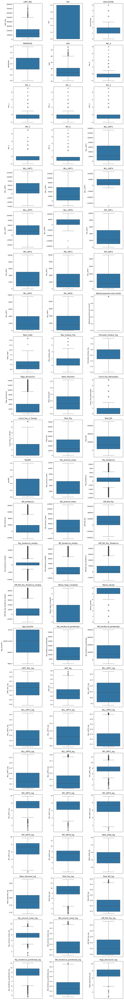

In [51]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.boxplot(y=df[var])  
    plt.title(var)  
plt.tight_layout()  
plt.show()

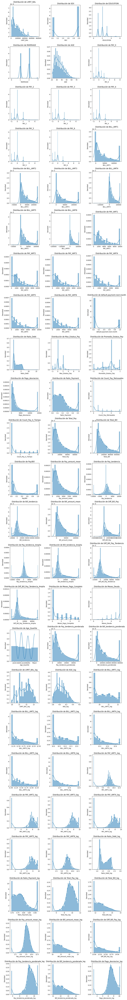

In [52]:
aux = df.drop(columns = 'CUSTOMER_ID')
list_column = aux.columns

num_var = len(list_column)
cols = 3
rows = (num_var // cols) + (num_var % cols > 0)
plt.figure(figsize=(cols * 4, rows * 4))

for i, var in enumerate(list_column, 1):
    plt.subplot(rows, cols, i)  
    sns.histplot(df[var], kde=True, stat="density", linewidth=0)
    plt.plot(linewidth=2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

### Codificacion

In [53]:
df

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,6496,90000.0,2,1,2,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0,1.147722,0,0.000000,1964.650673,0.333644,0,0,30028.0,103295.0,0.290701,5004.666667,-41.0,-1124.0,17215.833333,73267.0,-2042.000000,-1189.666667,-1083.0,852.333333,0,6,Joven,15364.15,54662.50,11.512945,3.891820,10.283669,11.341627,10.545420,12.129418,11.298965,12.336579,8.518592,8.546169,7.497207,8.522380,8.988321,8.526747,1.513645,0.847431,10.309952,12.340503,8.518526,10.548787,13.135102,9.639922,11.580558,7.584087
1,15681,90000.0,2,1,2,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1,1.969978,2,0.666667,1364.795467,0.095556,2,0,8600.0,177298.0,0.048506,1433.333333,0.0,-5042.0,29549.666667,168698.0,-333.333333,-2980.000000,-5042.0,-2646.666667,0,6,Joven,4170.00,93317.10,11.512945,3.912023,10.590441,11.484917,10.796223,12.204747,11.424225,12.397936,0.693147,7.496652,7.601902,7.091742,8.189245,0.693147,1.679993,0.739819,9.059750,12.620762,7.269152,10.829035,13.307749,8.336151,11.888974,7.220224
2,17874,90000.0,2,2,1,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0,0.571700,0,0.000000,607.027731,0.122578,0,0,11032.0,51453.0,0.214409,1838.666667,-478.0,7924.0,8575.500000,40421.0,344.000000,7533.000000,8402.0,7189.000000,0,6,Adulto joven,6104.50,33904.35,11.512945,3.951244,10.139231,11.336224,10.293974,12.067816,11.094102,12.277923,7.329094,8.010360,7.314553,7.314553,7.314553,7.601902,1.378071,0.752631,9.308737,12.083538,7.517883,10.291835,13.068042,8.717109,11.364879,6.411864
3,7771,110000.0,1,2,2,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0,3.963773,0,0.000000,266.458252,0.160364,0,0,17640.0,436015.0,0.040457,2940.000000,640.0,-1057.0,72669.166667,418375.0,246.666667,-438.333333,-1697.0,-685.000000,0,6,Mayor,9867.50,235851.15,11.695264,4.248495,11.343844,11.867336,11.429761,12.398427,11.803107,12.553227,8.099251,8.071531,7.901748,7.938089,8.007034,7.883069,1.995967,0.770277,9.778038,13.238362,7.986845,11.446620,13.654776,9.197204,12.571361,5.592695
4,2933,210000.0,1,2,1,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0,1.791552,0,0.000000,376.386326,0.073810,0,0,15500.0,376226.0,0.041199,2583.333333,500.0,31508.0,62704.333333,360726.0,500.000000,20748.000000,31008.0,20248.000000,0,6,Adulto,8725.00,225109.60,12.301392,4.094345,11.481166,11.951451,11.141383,12.305139,11.641495,12.479423,7.824846,8.007034,8.007034,7.824846,7.824846,7.601902,1.646173,0.729387,9.648724,13.125774,7.857610,11.334034,13.584674,9.074177,12.533376,5.935916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [54]:
df['Age_Quartile'].unique()

['Joven', 'Adulto joven', 'Mayor', 'Adulto']
Categories (4, object): ['Joven' < 'Adulto joven' < 'Adulto' < 'Mayor']

In [55]:
df = pd.get_dummies(df, columns = ['EDUCATION'],prefix='EDUCATION') # Codificamos las variables para el modelo
df = pd.get_dummies(df, columns = ['MARRIAGE'],prefix='MARRIAGE')
df = pd.get_dummies(df, columns = ['SEX'],prefix='SEX')
mapeo_Age = {'Joven':1, 'Adulto joven' :2, 'Adulto':3, 'Mayor':4}
df['Age_Quartile'] = df['Age_Quartile'].map(mapeo_Age)

In [56]:
aux = df.drop(columns = ['default.payment.next.month'])
cod_columns = aux.columns

In [57]:
df

,CUSTOMER_ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,6496,90000.0,26,0,0,0,0,0,0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,0,1.147722,0,0.000000,1964.650673,0.333644,0,0,30028.0,103295.0,0.290701,5004.666667,-41.0,-1124.0,17215.833333,73267.0,-2042.000000,-1189.666667,-1083.0,852.333333,0,6,1,15364.15,54662.50,11.512945,3.891820,10.283669,11.341627,10.545420,12.129418,11.298965,12.336579,8.518592,8.546169,7.497207,8.522380,8.988321,8.526747,1.513645,0.847431,10.309952,12.340503,8.518526,10.548787,13.135102,9.639922,11.580558,7.584087,False,True,False,False,False,False,False,False,False,True,False,False,True
1,15681,90000.0,27,2,2,0,0,0,0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1,1.969978,2,0.666667,1364.795467,0.095556,2,0,8600.0,177298.0,0.048506,1433.333333,0.0,-5042.0,29549.666667,168698.0,-333.333333,-2980.000000,-5042.0,-2646.666667,0,6,1,4170.00,93317.10,11.512945,3.912023,10.590441,11.484917,10.796223,12.204747,11.424225,12.397936,0.693147,7.496652,7.601902,7.091742,8.189245,0.693147,1.679993,0.739819,9.059750,12.620762,7.269152,10.829035,13.307749,8.336151,11.888974,7.220224,False,True,False,False,False,False,False,False,False,True,False,False,True
2,17874,90000.0,29,0,0,0,0,0,0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0,0.571700,0,0.000000,607.027731,0.122578,0,0,11032.0,51453.0,0.214409,1838.666667,-478.0,7924.0,8575.500000,40421.0,344.000000,7533.000000,8402.0,7189.000000,0,6,2,6104.50,33904.35,11.512945,3.951244,10.139231,11.336224,10.293974,12.067816,11.094102,12.277923,7.329094,8.010360,7.314553,7.314553,7.314553,7.601902,1.378071,0.752631,9.308737,12.083538,7.517883,10.291835,13.068042,8.717109,11.364879,6.411864,False,False,True,False,False,False,False,False,True,False,False,False,True
3,7771,110000.0,47,0,0,0,0,0,0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,0,3.963773,0,0.000000,266.458252,0.160364,0,0,17640.0,436015.0,0.040457,2940.000000,640.0,-1057.0,72669.166667,418375.0,246.666667,-438.333333,-1697.0,-685.000000,0,6,4,9867.50,235851.15,11.695264,4.248495,11.343844,11.867336,11.429761,12.398427,11.803107,12.553227,8.099251,8.071531,7.901748,7.938089,8.007034,7.883069,1.995967,0.770277,9.778038,13.238362,7.986845,11.446620,13.654776,9.197204,12.571361,5.592695,False,False,True,False,False,False,False,False,False,True,False,True,False
4,2933,210000.0,37,0,0,0,0,0,0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,0,1.791552,0,0.000000,376.386326,0.073810,0,0,15500.0,376226.0,0.041199,2583.333333,500.0,31508.0,62704.333333,360726.0,500.000000,20748.000000,31008.0,20248.000000,0,6,3,8725.00,225109.60,12.301392,4.094345,11.481166,11.951451,11.141383,12.305139,11.641495,12.479423,7.824846,8.007034,8.007034,7.824846,7.8248

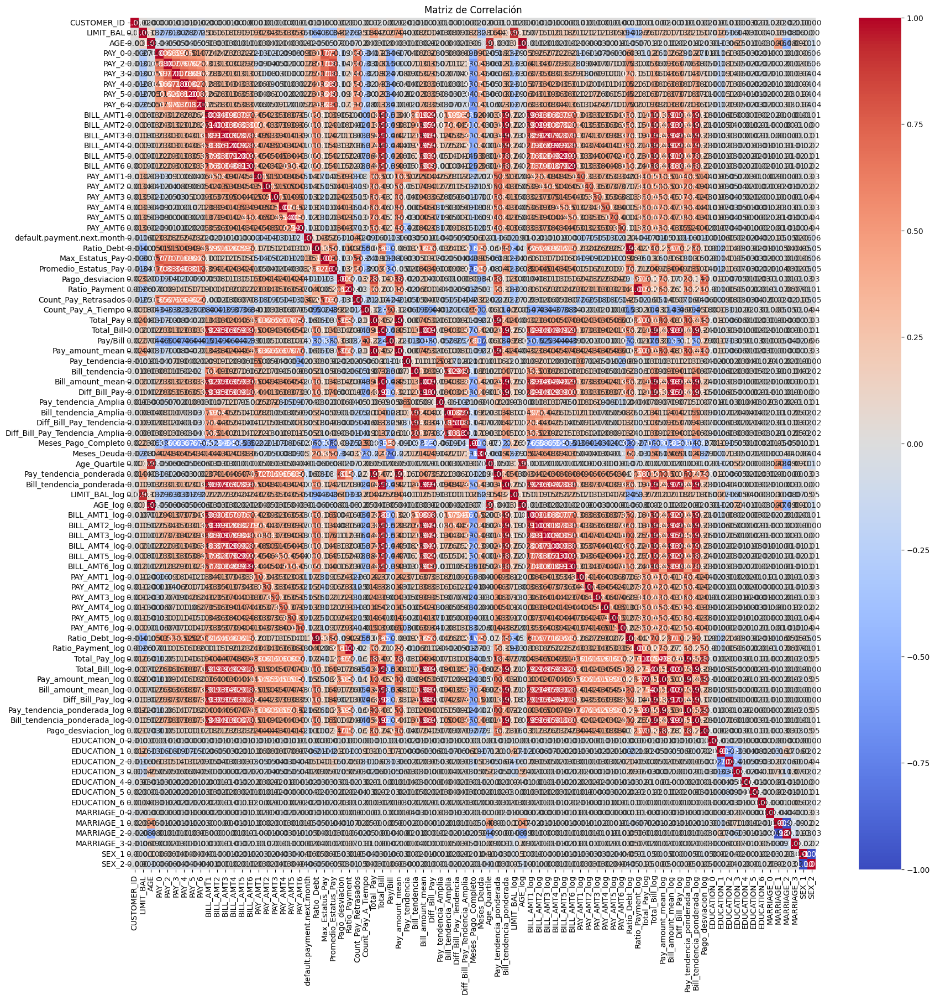

In [99]:
correlation_matrix = df.corr()
target_correlation = correlation_matrix["default.payment.next.month"].sort_values(ascending=False)
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

In [59]:
df['default.payment.next.month'].value_counts()/len(df)

default.payment.next.month
0    0.779022
1    0.220978
Name: count, dtype: float64

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5625 entries, 0 to 5624
Data columns (total 83 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     5625 non-null   int64   
 1   LIMIT_BAL                       5625 non-null   float64 
 2   AGE                             5625 non-null   int64   
 3   PAY_0                           5625 non-null   int64   
 4   PAY_2                           5625 non-null   int64   
 5   PAY_3                           5625 non-null   int64   
 6   PAY_4                           5625 non-null   int64   
 7   PAY_5                           5625 non-null   int64   
 8   PAY_6                           5625 non-null   int64   
 9   BILL_AMT1                       5625 non-null   float64 
 10  BILL_AMT2                       5625 non-null   float64 
 11  BILL_AMT3                       5625 non-null   float64 
 12  BILL_AMT4           

In [61]:
numeric_columns = df.select_dtypes(include = ['float64']).columns

In [62]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment', 'Total_Pay',
       'Total_Bill', 'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia',
       'Bill_tendencia', 'Bill_amount_mean', 'Diff_Bill_Pay',
       'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada', 'LIMIT_BAL_log',
       'AGE_log', 'BILL_AMT1_log', 'BILL_AMT2_log', 'BILL_AMT3_log',
       'BILL_AMT4_log', 'BILL_AMT5_log', 'BILL_AMT6_log', 'PAY_AMT1_log',
       'PAY_AMT2_log', 'PAY_AMT3_log', 'PAY_AMT4_log', 'PAY_AMT5_log',
       'PAY_AMT6_log', 'Ratio_Debt_log', 'Ratio_Payment_log', 'Total_Pay_log',
       'Total_Bill_log', 'Pay_amount_mean_log', 'Bill_amount_mean_log',
       'Diff_Bill_Pay_l

In [63]:
len(numeric_columns)

55

In [64]:
numeric_columns

Index(['LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Ratio_Debt',
       'Promedio_Estatus_Pay', 'Pago_desviacion', 'Ratio_Payment', 'Total_Pay',
       'Total_Bill', 'Pay/Bill', 'Pay_amount_mean', 'Pay_tendencia',
       'Bill_tendencia', 'Bill_amount_mean', 'Diff_Bill_Pay',
       'Pay_tendencia_Amplia', 'Bill_tendencia_Amplia',
       'Diff_Bill_Pay_Tendencia', 'Diff_Bill_Pay_Tendencia_Amplia',
       'Pay_tendencia_ponderada', 'Bill_tendencia_ponderada', 'LIMIT_BAL_log',
       'AGE_log', 'BILL_AMT1_log', 'BILL_AMT2_log', 'BILL_AMT3_log',
       'BILL_AMT4_log', 'BILL_AMT5_log', 'BILL_AMT6_log', 'PAY_AMT1_log',
       'PAY_AMT2_log', 'PAY_AMT3_log', 'PAY_AMT4_log', 'PAY_AMT5_log',
       'PAY_AMT6_log', 'Ratio_Debt_log', 'Ratio_Payment_log', 'Total_Pay_log',
       'Total_Bill_log', 'Pay_amount_mean_log', 'Bill_amount_mean_log',
       'Diff_Bill_Pay_l

In [75]:
categorical_columns = df.select_dtypes(exclude = ['float64']).drop(columns = ['CUSTOMER_ID']).columns

In [76]:
categorical_columns = [col for col in categorical_columns if col != 'default.payment.next.month']

In [239]:
categorical_columns

['AGE',
 'PAY_0',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'Max_Estatus_Pay',
 'Count_Pay_Retrasados',
 'Count_Pay_A_Tiempo',
 'Meses_Pago_Completo',
 'Meses_Deuda',
 'Age_Quartile',
 'EDUCATION_0',
 'EDUCATION_1',
 'EDUCATION_2',
 'EDUCATION_3',
 'EDUCATION_4',
 'EDUCATION_5',
 'EDUCATION_6',
 'MARRIAGE_0',
 'MARRIAGE_1',
 'MARRIAGE_2',
 'MARRIAGE_3',
 'SEX_1',
 'SEX_2']

In [78]:
var_columns = list(categorical_columns) + list(numeric_columns)

In [79]:
var_columns

['AGE',
 'PAY_0',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'Max_Estatus_Pay',
 'Count_Pay_Retrasados',
 'Count_Pay_A_Tiempo',
 'Meses_Pago_Completo',
 'Meses_Deuda',
 'Age_Quartile',
 'EDUCATION_0',
 'EDUCATION_1',
 'EDUCATION_2',
 'EDUCATION_3',
 'EDUCATION_4',
 'EDUCATION_5',
 'EDUCATION_6',
 'MARRIAGE_0',
 'MARRIAGE_1',
 'MARRIAGE_2',
 'MARRIAGE_3',
 'SEX_1',
 'SEX_2',
 'LIMIT_BAL',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'Ratio_Debt',
 'Promedio_Estatus_Pay',
 'Pago_desviacion',
 'Ratio_Payment',
 'Total_Pay',
 'Total_Bill',
 'Pay/Bill',
 'Pay_amount_mean',
 'Pay_tendencia',
 'Bill_tendencia',
 'Bill_amount_mean',
 'Diff_Bill_Pay',
 'Pay_tendencia_Amplia',
 'Bill_tendencia_Amplia',
 'Diff_Bill_Pay_Tendencia',
 'Diff_Bill_Pay_Tendencia_Amplia',
 'Pay_tendencia_ponderada',
 'Bill_tendencia_ponderada',
 'LIMIT_BAL_log',
 'AGE_log',
 'BILL_AMT1_log',
 'BI

In [70]:
df[var_columns].drop(columns = ['CUSTOMER_ID'])

,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,26,0,0,0,0,0,0,0,0,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True,90000.0,17704.0,14478.0,17681.0,15240.0,19364.0,18828.0,5005.0,5145.0,1801.0,5024.0,8007.0,5046.0,1.147722,0.000000,1964.650673,0.333644,30028.0,103295.0,0.290701,5004.666667,-41.0,-1124.0,17215.833333,73267.0,-2042.000000,-1189.666667,-1083.0,852.333333,15364.15,54662.50,11.512945,3.891820,10.283669,11.341627,10.545420,12.129418,11.298965,12.336579,8.518592,8.546169,7.497207,8.522380,8.988321,8.526747,1.513645,0.847431,10.309952,12.340503,8.518526,10.548787,13.135102,9.639922,11.580558,7.584087
1,27,2,2,0,0,0,0,2,2,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,False,True,90000.0,28206.0,27459.0,28514.0,29733.0,30138.0,33248.0,0.0,1800.0,2000.0,1200.0,3600.0,0.0,1.969978,0.666667,1364.795467,0.095556,8600.0,177298.0,0.048506,1433.333333,0.0,-5042.0,29549.666667,168698.0,-333.333333,-2980.000000,-5042.0,-2646.666667,4170.00,93317.10,11.512945,3.912023,10.590441,11.484917,10.796223,12.204747,11.424225,12.397936,0.693147,7.496652,7.601902,7.091742,8.189245,0.693147,1.679993,0.739819,9.059750,12.620762,7.269152,10.829035,13.307749,8.336151,11.888974,7.220224
2,29,0,0,0,0,0,0,0,0,0,0,6,2,False,False,True,False,False,False,False,False,True,False,False,False,True,90000.0,13770.0,14024.0,9232.0,4173.0,4408.0,5846.0,1522.0,3010.0,1500.0,1500.0,1500.0,2000.0,0.571700,0.000000,607.027731,0.122578,11032.0,51453.0,0.214409,1838.666667,-478.0,7924.0,8575.500000,40421.0,344.000000,7533.000000,8402.0,7189.000000,6104.50,33904.35,11.512945,3.951244,10.139231,11.336224,10.293974,12.067816,11.094102,12.277923,7.329094,8.010360,7.314553,7.314553,7.314553,7.601902,1.378071,0.752631,9.308737,12.083538,7.517883,10.291835,13.068042,8.717109,11.364879,6.411864
3,47,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,True,False,110000.0,72897.0,72755.0,71698.0,72418.0,72293.0,73954.0,3290.0,3200.0,2700.0,2800.0,3000.0,2650.0,3.963773,0.000000,266.458252,0.160364,17640.0,436015.0,0.040457,2940.000000,640.0,-1057.0,72669.166667,418375.0,246.666667,-438.333333,-1697.0,-685.000000,9867.50,235851.15,11.695264,4.248495,11.343844,11.867336,11.429761,12.398427,11.803107,12.553227,8.099251,8.071531,7.901748,7.938089,8.007034,7.883069,1.995967,0.770277,9.778038,13.238362,7.986845,11.446620,13.654776,9.197204,12.571361,5.592695
4,37,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,True,False,210000.0,85327.0,85263.0,48645.0,50826.0,52346.0,53819.0,2500.0,3000.0,3000.0,2500.0,2500.0,2000.0,1.791552,0.000000,376.386326,0.073810,15500.0,376226.0,0.041199,2583.333333,500.0,31508.0,62704.333333,360726.0,500.000000,20748.000000,31008.0,20248.000000,8725.00,225109.60,12.301392,4.094345,11.481166,11.951451,11.141383,12.305139,11.641495,12.479423,7.824846,8.007034,8.007034,7.824846,7.82484

In [71]:
df['default.payment.next.month']

0       0
1       1
2       0
3       0
4       0
       ..
5620    0
5621    0
5622    0
5623    0
5624    0
Name: default.payment.next.month, Length: 5625, dtype: int64

In [101]:
X_train, X_test, y_train, y_test = train_test_split(df[var_columns],
                                                    df['default.payment.next.month'], test_size=0.30, random_state=seed)

In [243]:
X_train[numeric_columns]

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
1779,30000.0,24367.0,28682.0,27922.0,28632.0,29075.0,30891.0,4723.0,0.0,1173.0,1056.0,2300.0,0.0,5.652300,1.000000,1778.831639,0.308400,9252.0,169569.0,0.054562,1542.000000,4723.0,-6524.0,28261.500000,160317.0,846.666667,-2542.333333,-11247.0,-3389.000000,6592.00,88872.25,10.596685,4.043051,10.488882,11.497416,10.784027,12.199219,11.412541,12.388161,8.460623,0.693147,7.069023,6.964136,7.741534,0.693147,2.202526,0.836555,9.132811,12.594904,7.342132,10.803178,13.293725,8.793915,11.857982,7.484836
1070,50000.0,47486.0,47963.0,33499.0,19227.0,19334.0,19735.0,1703.0,1304.0,680.0,696.0,717.0,677.0,3.744880,0.000000,437.623316,0.115540,5777.0,187244.0,0.030853,962.833333,1026.0,27751.0,31207.333333,181467.0,532.333333,23550.666667,26725.0,23018.333333,3718.85,120970.25,11.002133,3.828641,10.985852,11.676251,10.893419,12.150713,11.298593,12.340551,7.441320,7.174724,6.525030,6.548219,6.577861,6.520621,1.965772,0.749310,8.661986,12.653083,6.871955,10.861355,13.328743,8.221707,12.062808,6.085918
3385,20000.0,18462.0,16699.0,19674.0,19258.0,9546.0,12051.0,1510.0,3875.0,759.0,9065.0,9533.0,1946.0,4.784500,-0.333333,7164.135054,0.521935,37216.0,95690.0,0.388923,6202.666667,-436.0,6411.0,15948.333333,58474.0,-8309.333333,4660.000000,6847.0,12969.333333,15401.35,56128.20,10.309019,3.806662,10.309253,11.367645,10.596535,12.150877,11.169308,12.306388,7.321189,8.262817,6.634633,9.210540,9.695971,7.574558,2.101697,0.925026,10.524548,12.306696,8.733057,10.514982,13.105455,9.642340,11.594164,8.877122
2705,230000.0,13668.0,12647.0,13135.0,10596.0,9218.0,5068.0,0.0,1064.0,423.0,313.0,1000.0,4641.0,0.279704,0.500000,1715.796890,0.032352,7441.0,64332.0,0.115666,1240.166667,-4641.0,8600.0,10722.000000,56891.0,-1489.000000,4856.000000,13241.0,6345.000000,2188.80,39328.05,12.388403,3.912023,10.135194,11.319656,10.418016,12.104029,11.164672,12.274297,0.693147,6.971669,6.052089,5.752573,6.909753,8.443116,1.301620,0.709194,8.915029,12.153800,7.124612,10.362093,13.102230,7.692022,11.425872,7.448798
4025,340000.0,14087.0,11007.0,16971.0,10734.0,9200.0,23818.0,10000.0,10064.0,10000.0,9065.0,9533.0,9344.0,0.252403,-1.000000,14122.999645,0.347297,70902.0,85817.0,1.000000,11817.000000,-9627.0,-9731.0,14302.833333,-32264.0,-10528.000000,-562.333333,25547.0,12950.000000,37750.00,43687.85,12.765694,4.174387,10.151675,11.299559,10.526561,12.104793,11.164417,12.358240,9.307013,9.742556,9.281358,9.127176,9.695971,10.742746,1.294163,0.853264,11.679143,12.261029,9.887468,10.469317,12.971989,10.788354,11.472339,9.555702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,60000.0,33290.0,32867.0,32638.0,29743.0,26909.0,24955.0,1558.0,1571.0,1344.0,877.0,875.0,3000.0,3.006700,0.000000,781.416342,0.153750,9225.0,180402.0,0.051136,1537.500000,-1442.0,8335.0,30067.000000,171177.0,-93.000000,5729.333333,9777.0,5822.333333,4649.80,102723.35,11.156279,4.290459,10.710789,11.539041,10.877292,12.204797,11.388303,12.363111,7.352441,7.360740,7.204893,6.778785,6.776507,8.007034,1.856648,0.767211,9.129889,12

In [241]:
sc = StandardScaler()
X_train_nsc = sc.fit_transform(X_train[numeric_columns])
X_test_nsc = sc.transform(X_test[numeric_columns])

In [250]:
X_train_sc = pd.DataFrame(X_train_nsc, columns = numeric_columns, index = X_train[numeric_columns].index)
X_test_sc = pd.DataFrame(X_test_nsc, columns = numeric_columns, index = X_test[numeric_columns].index)

In [251]:
X_train_f = pd.concat([X_train_sc, X_train[categorical_columns]], axis = 1)
X_test_f = pd.concat([X_test_sc, X_test[categorical_columns]], axis = 1)

In [385]:
X_test_f

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
3782,-1.125690,-0.659801,-0.613888,-0.905909,-0.904478,-0.887383,-0.868487,0.510138,-0.992119,-0.940647,-0.898228,-0.879596,-0.679936,-0.477238,-0.947513,-0.335165,0.549232,-0.796738,-0.852184,-0.236264,-0.796738,0.876460,0.031131,-0.852184,-0.784243,0.184715,0.047678,-0.119270,-0.017593,-0.652730,-0.791803,-1.779657,-0.830393,-0.509103,-0.574257,-1.164219,-0.911938,-0.976464,-0.859101,0.592593,-1.963059,-1.945478,-1.784972,-1.748473,0.100385,-0.347208,0.588478,-0.543742,-0.956072,-0.368873,-0.956067,-0.816237,-0.183603,-0.830202,0.216583,28,0,0,0,-2,-2,-2,0,0,0,4,5,1,False,True,False,False,False,False,False,False,False,True,False,False,True
4889,-0.502735,-0.929668,-0.922300,-0.905909,-0.904478,-0.819788,-0.868487,-1.044034,-0.992119,-0.940647,-0.043071,-0.879596,-0.856873,-1.078128,-1.155750,-0.558323,-1.068233,-0.935281,-0.952385,1.904436,-0.935281,-0.176134,-0.434337,-0.952385,-0.875577,-0.328415,-0.486891,-0.391409,-0.415711,-0.993389,-0.954304,-0.196528,-1.368587,-1.285435,-1.018400,-1.164219,-0.911938,-0.874172,-0.859101,-2.028990,-1.963059,-1.945478,0.538311,-1.748473,-0.519734,-1.203428,-1.105151,-1.069677,-1.171001,-0.773447,-1.170987,-0.944317,-1.125545,-1.219488,-0.118880,24,1,-2,-2,-2,-1,-1,1,1,2,5,4,1,False,False,False,True,False,False,False,False,False,True,False,False,True
1302,-1.047821,-0.291821,-0.260679,-0.173296,-0.119674,-0.061051,-0.058406,-0.484532,0.018492,-0.940647,-0.381621,-0.386510,-0.451115,1.765063,0.718384,-0.547147,0.756884,-0.624614,-0.187354,-0.696075,-0.624614,-0.039495,-0.459562,-0.187354,-0.102950,-0.080155,-0.465000,-0.435740,-0.457742,-0.609468,-0.231560,-1.429134,-1.368587,0.065233,-0.146366,0.117770,-0.093781,0.059984,-0.054622,0.250526,0.504910,-1.945478,0.374138,0.378900,0.331908,1.556888,0.792056,-0.197512,0.042782,-0.102188,0.042771,-0.008409,-0.124626,0.040423,-0.095295,24,0,0,0,2,0,0,2,1,0,0,6,1,False,True,False,False,False,False,False,False,False,True,False,True,False
313,0.431698,-0.923208,-0.913309,-0.906004,-0.894307,-0.876603,-0.857459,-0.888617,-0.992119,-0.694017,-0.760466,-0.749422,-0.620070,-1.086006,-0.947513,-0.717292,-1.147778,-0.920877,-0.955100,1.904436,-0.920877,-0.226078,-0.438515,-0.955100,-0.879882,-0.161063,-0.449131,-0.387667,-0.421244,-0.970740,-0.952864,0.702232,0.017094,-1.258645,-1.004280,-1.164219,-0.900430,-0.959876,-0.847415,-0.177685,-1.963059,0.064953,-0.055669,-0.047802,0.179572,-1.216629,-1.193855,-0.991438,-1.171001,-0.713321,-1.170987,-0.950499,-0.994491,-1.219488,-0.713692,35,-1,-1,-1,-1,-1,-1,-1,0,6,5,2,3,False,True,False,False,False,False,False,False,True,False,False,False,True
5138,-0.346996,-0.511263,-0.467136,-0.412926,-0.345090,-0.282647,-0.232270,-0.577782,-0.563375,-0.629245,-0.553823,-0.550872,-0.218303,-0.584834,0.718384,-0.693652,-0.813193,-0.692773,-0.414032,-0.668923,-0.692773,-0.275080,-0.596521,-0.414032,-0.334287,-0.146594,-0.577343,-0.527137,-0.552

In [105]:
model_logreg = LogisticRegression(max_iter = 2000)

In [254]:
model_logreg.fit(X_train_f,y_train)

LogisticRegression(max_iter=2000)

In [107]:
model_lda = LinearDiscriminantAnalysis()

In [255]:
model_lda.fit(X_train_f, y_train)

LinearDiscriminantAnalysis()

In [256]:
cv_scores = cross_val_score(model_logreg, X_train_f, y_train, cv=5, scoring='roc_auc')

In [257]:
print(cv_scores)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

[0.78836214 0.75343745 0.75080115 0.79747247 0.79534295]
roc_auc: 0.78 (+/- 0.04)


In [258]:
y_pred = model_logreg.predict(X_test_f)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC Regresion Logistica con conunto de prueba: {roc_auc}")

Roc_AUC Regresion Logistica con conunto de prueba: 0.6480338018741634


In [259]:
cv_scores_LDA = cross_val_score(model_lda, X_train_f, y_train, cv=5, scoring='roc_auc')

In [260]:
print(cv_scores_LDA)
print("roc_auc: %0.2f (+/- %0.2f)" % (cv_scores_LDA.mean(), cv_scores_LDA.std() * 2))

[0.78781658 0.75363163 0.74914328 0.79573352 0.79684013]
roc_auc: 0.78 (+/- 0.04)


In [261]:
y_pred = model_lda.predict(X_test_f)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"Roc_AUC LDA con conunto de prueba: {roc_auc}")

Roc_AUC LDA con conunto de prueba: 0.6682563587684068


### Modelo con SelectKbest

In [374]:
selector = SelectKBest(score_func = mutual_info_classif, k = 60)

X_train_selected = selector.fit_transform(X_train_f, y_train)
X_test_selected = selector.transform(X_test_f)

In [375]:
model_k_best = LogisticRegression(max_iter=2000) # Marcaba error de que el modelo no convergia 

In [376]:
model_k_best.fit(X_train_selected, y_train)

LogisticRegression(max_iter=2000)

In [377]:
cv_scores_kbest = cross_val_score(model_k_best, X_train_selected, y_train, cv=5, scoring='roc_auc')

In [378]:
print(cv_scores_kbest)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_kbest.mean(), cv_scores_kbest.std() * 2))

[0.78623078 0.74403358 0.75023618 0.78832205 0.79979728]
roc_AUC: 0.77 (+/- 0.04)


In [379]:
y_pred = model_k_best.predict(X_test_selected)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 SelectKbeast con conjunto de prueba: {roc_auc}")

R2 SelectKbeast con conjunto de prueba: 0.6439842704149933


In [380]:
model_LDA_k_best = LinearDiscriminantAnalysis()

In [381]:
model_LDA_k_best.fit(X_train_selected,y_train)

LinearDiscriminantAnalysis()

In [382]:
cv_scores_LDA_k_best = cross_val_score(model_LDA_k_best, X_train_selected, y_train, cv=5, scoring = 'roc_auc')

In [383]:
print(cv_scores_LDA_k_best)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_LDA_k_best.mean(), cv_scores_LDA_k_best.std() * 2))

[0.78996643 0.74249864 0.75306104 0.79060966 0.80050402]
roc_AUC: 0.78 (+/- 0.05)


In [384]:
y_pred = model_LDA_k_best.predict(X_test_selected)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 LDA SelectKbeast con conjunto de prueba: {roc_auc}")

R2 LDA SelectKbeast con conjunto de prueba: 0.6574046184738956


### Modelo no lineal

In [408]:
xgb_c = XGBClassifier(enable_categorical=True, tree_method='hist')

In [409]:
xgb_c.fit(X_train_f, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [411]:
cv_scores_xgb_c = cross_val_score(xgb_c, X_train_f, y_train, cv=5, scoring = 'roc_auc')

In [412]:
print(cv_scores_xgb_c)
print("roc_AUC: %0.2f (+/- %0.2f)" % (cv_scores_xgb_c.mean(), cv_scores_xgb_c.std() * 2))

[0.74394112 0.71361203 0.74290081 0.78729914 0.77078374]
roc_AUC: 0.75 (+/- 0.05)


In [414]:
y_pred = xgb_c.predict(X_test_f)
roc_auc = roc_auc_score(y_test, y_pred)
print(f"R2 XGB: {roc_auc}")

R2 XGB: 0.6479668674698795


### Validacion

In [194]:
val = pd.read_csv('datos/val_default.csv', sep = '|' )

In [195]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,90000.0,2,5,2,31,1,-2,-2,-2,-2,-2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1871,15109,210000.0,2,2,1,36,0,0,0,0,0,0,13460.0,14765.0,14939.0,15748.0,16069.0,13780.0,1534.0,1307.0,1116.0,437.0,399.0,276.0
1872,12508,450000.0,1,1,2,34,-1,-1,-1,-1,-1,-1,583.0,-16.0,2312.0,192.0,1630.0,14099.0,0.0,2328.0,192.0,1638.0,14169.0,1122.0
1873,23226,60000.0,2,3,2,23,0,0,0,0,0,0,30660.0,30286.0,29757.0,30122.0,30498.0,28647.0,1800.0,1630.0,3000.0,2000.0,2000.0,2000.0


In [196]:
val['Ratio_Debt'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)/val['LIMIT_BAL'] 

In [197]:
val['Max_Estatus_Pay'] = val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].max(axis = 1)

In [198]:
val['Promedio_Estatus_Pay'] = val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']].mean(axis = 1) 

In [199]:
val['Pago_desviacion'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].std(axis = 1)

In [200]:
val['Ratio_Payment'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1) / df['LIMIT_BAL']

In [201]:
val['Count_Pay_Retrasados'] = (val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] > 0 ).sum(axis = 1)

In [202]:
val['Count_Pay_A_Tiempo'] = (val[['PAY_0','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']] == -1).sum(axis = 1) # Conteo de meses pagados a tiempo

In [203]:
val['Total_Pay'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].sum(axis = 1)

In [204]:
val['Total_Bill'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].sum(axis = 1)

In [205]:
val['Pay/Bill'] =np.where(val['Total_Bill'] == 0, 0, val['Total_Pay'] / val['Total_Bill'])

In [206]:
val['Pay_amount_mean'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis = 1)

In [207]:
val['Pay_tendencia'] = val['PAY_AMT1'] - val ['PAY_AMT6']

In [208]:
val['Bill_tendencia'] = val['BILL_AMT1'] - df['BILL_AMT6'] 

In [209]:
val['Bill_amount_mean'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis = 1)

In [210]:
val['Diff_Bill_Pay'] = val['Total_Bill'] - val['Total_Pay']

In [211]:
val['Pay_tendencia_Amplia'] = val[['PAY_AMT1','PAY_AMT2','PAY_AMT3']].mean(axis = 1) - val[['PAY_AMT4','PAY_AMT5','PAY_AMT6']].mean(axis =1)

In [212]:
val['Bill_tendencia_Amplia'] = val[['BILL_AMT1','BILL_AMT2','BILL_AMT3']].mean(axis = 1) - val[['BILL_AMT4','BILL_AMT5','BILL_AMT6']].mean(axis =1)

In [213]:
val['Diff_Bill_Pay_Tendencia'] = ((val['BILL_AMT1'] - val['PAY_AMT1']) - (val['BILL_AMT6'] - val['PAY_AMT6']))

In [214]:
val['Diff_Bill_Pay_Tendencia_Amplia'] = (
    (val[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].mean(axis=1)  - val[['PAY_AMT1','PAY_AMT2', 'PAY_AMT3']].mean(axis=1))
    - 
    ( val[['BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].mean(axis=1) - val[['PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']].mean(axis=1))
)

In [215]:
val['Meses_Pago_Completo'] = ( (val['PAY_AMT1'] >= val['BILL_AMT1']) + (
                            val['PAY_AMT2'] >= val['BILL_AMT2']).astype(int) + (
                            val['PAY_AMT3'] >= val['BILL_AMT3']).astype(int) + (
                            val['PAY_AMT4'] >= val['BILL_AMT4']).astype(int) + (
                            val['PAY_AMT5'] >= val['BILL_AMT5']).astype(int) +(
                            val['PAY_AMT6'] >= val['BILL_AMT6']).astype(int))

In [216]:
val['Meses_Deuda'] = ( (val['PAY_AMT1'] <= val['BILL_AMT1']).astype(int) +(
                        val['PAY_AMT2'] <= val['BILL_AMT2']).astype(int) + (
                        val['PAY_AMT3'] <= val['BILL_AMT3']).astype(int) + (
                        val['PAY_AMT4'] <= val['BILL_AMT4']).astype(int) + (
                        val['PAY_AMT5'] <= val['BILL_AMT5']).astype(int) +(
                        val['PAY_AMT6'] <= val['BILL_AMT6']).astype(int))

In [217]:
val['Age_Quartile'] = pd.qcut(val['AGE'], q =4, labels = ['Joven', 'Adulto joven', 'Adulto', 'Mayor'])

In [218]:
val['Pay_tendencia_ponderada'] = (val['PAY_AMT1'] *1) +(
                                val['PAY_AMT2'] * 0.75) + (
                                val['PAY_AMT3'] * 0.6) + (
                                val['PAY_AMT4'] * 0.45) + (
                                val['PAY_AMT5'] * 0.3 ) + (
                                val['PAY_AMT6'] * 0.15)

In [219]:
val['Bill_tendencia_ponderada'] = (val['BILL_AMT1'] * 1) + (
                                val['BILL_AMT2'] * 0.75) + (
                                val['BILL_AMT3'] * 0.6) + (
                                val['BILL_AMT4'] * 0.45) + (
                                val['BILL_AMT5'] * 0.3) + (
                                val['BILL_AMT6'] * 0.15)

In [220]:
val.shape

(1875, 48)

In [221]:
lst_column_log_val = ['LIMIT_BAL','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2',
                  'PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Ratio_Debt','Ratio_Payment','Total_Pay','Total_Bill',
                  'Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Pay_tendencia_ponderada','Bill_tendencia_ponderada','Pago_desviacion']

In [222]:
for col in lst_column_log_val:
    offset = abs(val[col].min()) + 1
    val[f'{col}_log'] = np.log1p(val[col] + offset)

In [223]:
val.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1875 entries, 0 to 1874
Data columns (total 72 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     1875 non-null   int64   
 1   LIMIT_BAL                       1875 non-null   float64 
 2   SEX                             1875 non-null   int64   
 3   EDUCATION                       1875 non-null   int64   
 4   MARRIAGE                        1875 non-null   int64   
 5   AGE                             1875 non-null   int64   
 6   PAY_0                           1875 non-null   int64   
 7   PAY_2                           1875 non-null   int64   
 8   PAY_3                           1875 non-null   int64   
 9   PAY_4                           1875 non-null   int64   
 10  PAY_5                           1875 non-null   int64   
 11  PAY_6                           1875 non-null   int64   
 12  BILL_AMT1           

In [224]:
val_id = val.copy()

In [225]:
val

,CUSTOMER_ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Max_Estatus_Pay,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
0,942,50000.0,2,2,2,43,0,0,0,0,0,0,48474.0,48388.0,38972.0,47584.0,28055.0,28571.0,2334.0,1918.0,12530.0,1001.0,1035.0,1198.0,4.800880,0,0.000000,4535.685924,0.222400,0,0,20016.0,240044.0,0.083385,3336.000000,1136.0,29646.0,40007.333333,220028.0,4516.000000,10541.333333,18767.0,6025.333333,0,6,Mayor,12231.15,142263.15,11.002133,4.189655,12.223171,11.660621,11.073133,11.453313,11.221021,11.227907,7.756195,7.560080,9.436041,6.910751,6.944087,7.090077,1.965718,0.798588,9.904387,12.491823,8.113127,10.700101,13.291250,9.411905,11.914437,8.420172
1,7231,320000.0,2,1,1,42,1,2,2,0,0,0,318844.0,324589.0,320622.0,252323.0,253557.0,256525.0,10000.0,450.0,7025.0,7161.0,8000.0,6883.0,5.395187,2,0.833333,3222.323432,0.439100,3,0,39519.0,1726460.0,0.022890,6586.500000,3117.0,285596.0,287743.333333,1686941.0,-1523.000000,67216.666667,59202.0,68739.666667,0,6,Mayor,21207.40,982750.15,12.706854,4.174387,13.068581,12.879316,12.754388,12.608038,12.612158,12.621996,9.210540,6.113682,8.857515,8.876684,8.987447,8.837100,2.045671,0.891629,10.584587,14.376593,8.793081,12.584839,14.537685,9.962200,13.805354,8.078478
2,22096,230000.0,1,2,1,45,0,0,0,0,-1,-1,42770.0,22080.0,16740.0,14029.0,1439.0,2269.0,2000.0,1347.0,3078.0,1509.0,9000.0,8000.0,0.431857,0,-0.333333,3433.603976,0.277044,0,2,24934.0,99327.0,0.251029,4155.666667,-6000.0,36924.0,16554.500000,74393.0,-4028.000000,21284.333333,46501.0,25312.333333,2,4,Mayor,9436.10,76459.10,12.388403,4.219508,12.194734,11.403200,10.649820,11.013007,10.780372,10.797492,7.601902,7.207119,8.032685,7.320527,9.105202,8.987447,1.019214,0.822878,10.124068,11.739543,8.332709,9.947863,13.008877,9.152510,11.333848,8.141948
3,21996,200000.0,2,2,1,44,-2,-2,-2,-2,-2,-2,7096.0,1323.0,8457.0,48757.0,4200.0,7312.0,1336.0,8457.0,48757.0,4200.0,7312.0,21740.0,0.385725,-2,-2.000000,17830.774169,0.834564,0,0,91802.0,77145.0,1.189993,15300.333333,-20404.0,-66858.0,12857.500000,-14657.0,8432.666667,-14464.333333,20188.0,-22897.000000,4,2,Mayor,44277.55,37459.90,12.254872,4.204693,11.995790,11.139700,10.431229,11.465687,10.836222,10.895646,7.198931,9.042986,10.794645,8.343316,8.897546,9.987001,1.002426,1.041888,11.427411,11.544938,9.635761,9.753275,12.786353,10.698278,10.705599,9.788793
4,15155,210000.0,2,1,1,46,-2,-2,-2,-2,-2,-2,0.0,477.0,971.0,0.0,386.0,0.0,477.0,972.0,0.0,386.0,0.0,0.0,0.008733,-2,-2.000000,389.898662,0.008738,0,0,1835.0,1834.0,1.000545,305.833333,477.0,-53819.0,305.666667,-1.0,354.333333,354.000000,-477.0,-0.333333,4,3,Mayor,1379.70,1056.15,12.301392,4.234107,11.951019,11.127337,10.181725,10.749978,10.758222,10.749978,6.171701,6.881411,0.693147,5.961005,0.693147,0.693147,0.853518,0.697507,7.515889,10.237886,5.729559,8.446485,12.826552,7.231070,9.012030,5.971003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [226]:
lst_out_upper_val = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','Pago_desviacion',
           'PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Promedio_Estatus_Pay','Ratio_Payment','Total_Pay', 'Total_Bill',
                 'Pay/Bill','Pay_amount_mean','Bill_amount_mean','Diff_Bill_Pay','Ratio_Payment_log','Pay_tendencia_ponderada','Bill_tendencia_ponderada']
lst_out_both_val = ['Pay/Bill','Pay_tendencia','Bill_tendencia','Pay_tendencia_Amplia','Bill_tendencia_Amplia','Diff_Bill_Pay_Tendencia',
                'Diff_Bill_Pay_Tendencia_Amplia','BILL_AMT1_log','BILL_AMT2_log','BILL_AMT3_log','BILL_AMT4_log','BILL_AMT5_log','Pago_desviacion_log',
                'BILL_AMT6_log','PAY_AMT2_log','PAY_AMT3_log','PAY_AMT4_log','PAY_AMT5_log','Total_Pay_log','Diff_Bill_Pay_log','Pay_tendencia_ponderada_log']
lst_out_lower_val = ['Total_Bill_log','Bill_amount_mean_log','Bill_tendencia_ponderada_log']

In [227]:
for v in lst_out_upper_val: 
    val[v] = winsorize(val[v], limits = [0, 0.1])

for v in lst_out_both_val:
    val[v] = winsorize(val[v], limits = [0.05, 0.05])

for v in lst_out_lower_val:
    val[v] = winsorize(val[v], limits = [0.1, 0])

In [228]:
val.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1875 entries, 0 to 1874
Data columns (total 72 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   CUSTOMER_ID                     1875 non-null   int64   
 1   LIMIT_BAL                       1875 non-null   float64 
 2   SEX                             1875 non-null   int64   
 3   EDUCATION                       1875 non-null   int64   
 4   MARRIAGE                        1875 non-null   int64   
 5   AGE                             1875 non-null   int64   
 6   PAY_0                           1875 non-null   int64   
 7   PAY_2                           1875 non-null   int64   
 8   PAY_3                           1875 non-null   int64   
 9   PAY_4                           1875 non-null   int64   
 10  PAY_5                           1875 non-null   int64   
 11  PAY_6                           1875 non-null   int64   
 12  BILL_AMT1           

In [229]:
val = pd.get_dummies(val, columns = ['EDUCATION'],prefix='EDUCATION') 
val = pd.get_dummies(val, columns = ['MARRIAGE'],prefix='MARRIAGE')
val = pd.get_dummies(val, columns = ['SEX'],prefix='SEX')
mapeo_Age = {'Joven':1, 'Adulto joven' :2, 'Adulto':3, 'Mayor':4}
val['Age_Quartile'] = val['Age_Quartile'].map(mapeo_Age)

val = val.reindex(columns = cod_columns, fill_value = False)

In [230]:
numeric_columns_val = val.select_dtypes(include = ['float64']).columns

In [240]:
len(numeric_columns_val)

55

In [232]:
categorical_columns_val = val.select_dtypes(exclude = ['float64']).columns

In [233]:
categorical_columns_val

Index(['CUSTOMER_ID', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'Max_Estatus_Pay', 'Count_Pay_Retrasados',
       'Count_Pay_A_Tiempo', 'Meses_Pago_Completo', 'Meses_Deuda',
       'Age_Quartile', 'EDUCATION_0', 'EDUCATION_1', 'EDUCATION_2',
       'EDUCATION_3', 'EDUCATION_4', 'EDUCATION_5', 'EDUCATION_6',
       'MARRIAGE_0', 'MARRIAGE_1', 'MARRIAGE_2', 'MARRIAGE_3', 'SEX_1',
       'SEX_2'],
      dtype='object')

In [234]:
val_scaled = sc.transform(val[numeric_columns_val])
val_scaled = pd.DataFrame(val_scaled, columns = numeric_columns_val)

In [235]:
val_scaled.describe()

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log
count,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000,1875.000000
mean,0.003769,0.052608,0.027739,0.024225,0.035891,0.055024,0.073832,0.076342,0.034610,-0.000922,0.058028,-0.007135,0.006260,0.020168,0.004491,-0.018112,0.545582,0.020782,0.042826,-0.027393,0.020782,0.041196,0.235187,0.042826,0.039732,-0.042354,0.011281,0.018113,0.025078,0.025315,0.040586,-0.007888,-0.025971,1.794596,-0.045136,0.181469,-4.954917,-0.485918,-7.316751,0.009079,0.006345,-0.061758,-0.007301,0.008551,0.006697,-0.652727,0.438586,-0.088860,-0.892278,-0.010979,-0.892206,-0.304005,-0.040926,-0.826362,-0.009899
std,1.004784,1.133945,1.078043,1.058089,1.109775,1.143785,1.161317,1.123659,1.073668,1.024524,1.115990,0.965265,1.006025,1.025782,1.008390,0.969386,2.193438,1.047468,1.107358,0.982714,1.047468,1.026729,2.752671,1.107358,1.107008,0.984448,1.036295,1.020900,1.021064,1.050123,1.104838,1.023069,0.989871,0.283888,1.065292,0.931983,2.433694,1.240303,2.970713,1.003483,1.003281,1.048549,1.013664,1.004301,1.003225,1.273620,1.987004,1.268849,1.662372,1.024585,1.662286,1.161990,1.120658,1.691075,1.016395
min,-1.203560,-4.405867,-2.471152,-1.505822,-2.114245,-2.156718,-2.167017,-1.044034,-0.992119,-0.940647,-0.898228,-0.879596,-0.883480,-1.253240,-2.196936,-0.783505,-1.230824,-1.051742,-1.076967,-0.841026,-1.051742,-2.513139,-4.031099,-1.076967,-2.578537,-2.785473,-1.326371,-1.349276,-1.265937,-1.090482,-1.014283,-2.273680,-1.803198,1.538548,-1.101048,-0.853579,-7.374932,-1.685148,-10.124204,-2.028990,-1.963059,-1.945478,-1.784972,-1.748473,-1.663570,-2.679429,-1.287054,-4.478619,-3.257761,-3.553858,-3.257449,-1.400727,-3.791571,-3.420474,-3.155261
25%,-0.892082,-0.842109,-0.842559,-0.843167,-0.833906,-0.827914,-0.826518,-0.733199,-0.737935,-0.839130,-0.804378,-0.777856,-0.840576,-0.997010,-0.739276,-0.652491,-0.971893,-0.761045,-0.830895,-0.729265,-0.761045,-0.251522,-1.353375,-0.830895,-0.844864,-0.198453,-0.537815,-0.540648,-0.529856,-0.757615,-0.829850,-0.935092,-0.830393,1.565599,-0.974518,-0.716145,-7.091675,-1.567059,-9.927785,0.053886,0.045749,-0.232069,-0.180082,-0.126554,-0.376960,-2.029999,-0.998451,-0.455813,-2.362272,-0.301165,-2.362152,-1.326695,-0.355004,-2.249420,-0.382399
50%,-0.191257,-0.421651,-0.415344,-0.423914,-0.417764,-0.391268,-0.392988,-0.390971,-0.379627,-0.390711,-0.399530,-0.386510,-0.392912,-0.187767,0.301909,-0.471046,-0.481108,-0.389694,-0.397869,-0.620790,-0.389694,-0.013581,-0.311267,-0.397869,-0.390759,-0.050774,-0.402519,-0.357621,-0.384576,-0.385511,-0.394577,0.181393,-0.097504,1.686878,-0.387384,-0.038811,-5.685644,-0.834253,-8.19

In [236]:
val_categorical = val[categorical_columns_val]

In [237]:
val_categorical

,CUSTOMER_ID,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,942,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,7231,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,22096,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,21996,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,15155,46,-2,-2,-2,-2,-2,-2,-2,0,0,4,3,4,False,True,False,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,21254,31,1,-2,-2,-2,-2,-2,1,1,0,6,6,2,False,False,False,False,False,True,False,False,False,True,False,False,True
1871,15109,36,0,0,0,0,0,0,0,0,0,0,6,3,False,False,True,False,False,False,False,False,True,False,False,False,True
1872,12508,34,-1,-1,-1,-1,-1,-1,-1,0,6,3,3,2,False,True,False,False,False,False,False,False,False,True,False,True,False
1873,23226,23,0,0,0,0,0,0,0,0,0,0,6,1,False,False,False,True,False,False,False,False,False,True,False,False,True


In [388]:
val_mf = pd.concat([val_scaled, val_categorical.reset_index(drop=True)], axis=1)

In [389]:
val_mf = val_mf.drop(columns = ['CUSTOMER_ID'])

In [390]:
val_mf

,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Ratio_Debt,Promedio_Estatus_Pay,Pago_desviacion,Ratio_Payment,Total_Pay,Total_Bill,Pay/Bill,Pay_amount_mean,Pay_tendencia,Bill_tendencia,Bill_amount_mean,Diff_Bill_Pay,Pay_tendencia_Amplia,Bill_tendencia_Amplia,Diff_Bill_Pay_Tendencia,Diff_Bill_Pay_Tendencia_Amplia,Pay_tendencia_ponderada,Bill_tendencia_ponderada,LIMIT_BAL_log,AGE_log,BILL_AMT1_log,BILL_AMT2_log,BILL_AMT3_log,BILL_AMT4_log,BILL_AMT5_log,BILL_AMT6_log,PAY_AMT1_log,PAY_AMT2_log,PAY_AMT3_log,PAY_AMT4_log,PAY_AMT5_log,PAY_AMT6_log,Ratio_Debt_log,Ratio_Payment_log,Total_Pay_log,Total_Bill_log,Pay_amount_mean_log,Bill_amount_mean_log,Diff_Bill_Pay_log,Pay_tendencia_ponderada_log,Bill_tendencia_ponderada_log,Pago_desviacion_log,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,Max_Estatus_Pay,Count_Pay_Retrasados,Count_Pay_A_Tiempo,Meses_Pago_Completo,Meses_Deuda,Age_Quartile,EDUCATION_0,EDUCATION_1,EDUCATION_2,EDUCATION_3,EDUCATION_4,EDUCATION_5,EDUCATION_6,MARRIAGE_0,MARRIAGE_1,MARRIAGE_2,MARRIAGE_3,SEX_1,SEX_2
0,-0.892082,0.157652,0.187581,0.013000,0.330119,-0.123637,-0.072805,-0.318546,-0.404739,2.173374,-0.553479,-0.539367,-0.485039,1.219578,0.301909,0.230086,0.180026,-0.142233,0.082831,-0.612096,-0.142233,0.110337,0.712638,0.082831,0.132361,0.860915,0.165203,0.281005,-0.074689,-0.038945,0.121794,-0.935092,0.868498,1.834504,0.260818,0.429874,-3.860942,-0.470211,-7.172884,0.337486,0.324304,0.991883,0.242466,0.259874,0.306780,0.820964,0.219191,0.309895,-0.145123,0.288897,-0.145133,-0.055075,0.364884,0.051312,0.614239,43,0,0,0,0,0,0,0,0,0,0,6,4,False,False,True,False,False,False,False,False,False,True,False,False,True
1,1.210393,2.511022,2.356904,2.293602,2.474707,2.600233,2.651332,2.064310,-0.854308,1.246953,1.568056,1.750198,1.405725,1.505493,1.343095,-0.063412,1.554716,0.743966,2.436435,-0.778182,0.743966,0.577031,7.024788,2.436435,2.455023,-0.476500,3.018437,1.735976,2.934045,0.732762,2.445372,1.142127,0.767897,2.498596,2.410112,2.125190,0.573275,2.349647,-0.546502,0.824765,-0.157489,0.797515,0.883518,0.916380,0.844889,1.040886,1.548313,0.766603,2.550280,0.641040,2.550309,2.410509,0.709389,2.444347,0.447549,42,1,2,2,0,0,0,2,3,0,0,6,4,False,True,False,False,False,False,False,False,True,False,False,False,True
2,0.509568,0.029705,-0.415849,-0.511202,-0.540487,-0.848209,-0.805297,-0.422365,-0.579606,0.017849,-0.378521,2.078922,1.777226,-0.882312,-0.114565,-0.016197,0.526676,0.081236,-0.530369,-0.151834,0.081236,-1.570798,0.994216,-0.530369,-0.534544,-1.031265,0.781392,1.278957,1.021772,-0.279241,-0.378577,0.754091,1.065205,1.803580,-0.388003,-0.155040,-6.060793,-1.606754,-9.830795,0.285790,0.206733,0.520396,0.376086,0.954213,0.891198,-1.782534,0.566189,0.457396,-1.220955,0.402617,-1.220939,-0.858303,0.202493,-0.683447,0.478511,45,0,0,0,0,-1,-1,0,0,2,2,4,4,False,False,True,False,False,False,False,False,True,False,False,True,False
3,0.275959,-0.770498,-0.891955,-0.706504,0.360553,-0.773046,-0.664853,-0.628759,1.597802,2.173374,0.548273,1.524035,2.209590,-0.904506,-2.196936,2.324051,4.063437,2.329335,-0.627031,1.904436,2.329335,-2.513139,-3.021006,-0.627031,-0.942330,1.728312,-1.269052,0.332137,-1.265937,2.272805,-0.675125,0.591383,0.967586,1.587234,-1.052145,-0.457079,-3.799121,-1.462702,-9.224669,0.150775,0.818257,1.082462,0.709597,0.887496,1.199076,-1.828712,3.694800,1.332501,-1.499260,1.077458,-1.499228,-1.400727,1.170201,-1.478523,1.281897,44,-2,-2,-2,-2,-2,-2,-2,0,0,4,2,4,False,False,True,False,False,False,False,False,True,False,False,False,True
4,0.353829,-0.929668,-0.911359,-0.883015,-0.904478,-0.876875,-0.868487,-0.895766,-0.694448,-0.940647,-0.765288,-0.879596,-0.883480,-1.085872,-2.196936,-0.696374,-1.175391,-0.968361,-0.955213,1.904436,-0.968361,-0.044913,-2.516540,-0.955213,-0.875215,-0.060740,-0.419114,-0.411451,-0.417246,-0.971866,-0.951937,0.648068,1.161400,1.538548,-1.083307,-0.801832,-7.374932,-1.663884,-10.124204,-0.193399,0.098240,-1.9

In [393]:
y_hat = model_lda.predict(val_mf) 

In [395]:
df_predictions = pd.DataFrame({'CUSTOMER_ID':val_id['CUSTOMER_ID'], 'y_hat' : y_hat })

In [396]:
df_predictions

,CUSTOMER_ID,y_hat
0,942,0
1,7231,1
2,22096,0
3,21996,0
4,15155,0
...,...,...
1870,21254,0
1871,15109,0
1872,12508,0
1873,23226,0


In [399]:
df_predictions.to_csv("RoldanHernandezPaulHazel_DefaultPayment.csv", index=False, sep=",")

In [397]:
with open('Model_Examen_DefaultPayment_LDA', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(model_lda, archivo)

In [398]:
with open('Model_Examen_DefaultPayment_LogReg', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(model_logreg, archivo)

In [415]:
with open('Model_Examen_DefaultPayment_xgb', 'wb') as archivo: # Mejor con winsorizacion 0.05 , 10 y test size = 0.3 roc score : 0.66
    pickle.dump(xgb_c, archivo)